## Lab 3: Quasi-Geostrophic Height Tendency Equation
In this week's lab, we will use archived GFS model data to create 250 hPa, 500 hPa, and 850 hPa analyses, from which we will use the quasi-geostrohpic height tendency equation to investigate how two different troughs evolved. 
<br />

<br />

### Useful Documentation
1. Xarray open_dataset:  https://docs.xarray.dev/en/stable/generated/xarray.open_dataset.html
2. Matplotlib contour: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html
3. Cartopy feature: https://scitools.org.uk/cartopy/docs/latest/matplotlib/feature_interface.html
4. Datetime: https://docs.python.org/3/library/datetime.html



<br />

### Instructions
So that you can complete this week's lab, I have locally archived the January 17th, 2015 1800 UTC and January 18th, 0000 UTC GFS analyses.  The location of these data is provided for you below, as is the filenaming convention if you wish to use a datetime object to select your time of interest.

Create the following maps for both GFS analyses:

<ul>
  <li>250 hPa wind magnitude, wind barbs, and geopotential height
  <li>500 hPa absolute vorticity, wind barbs, and geopotential height
  <li>850 hPa air temperature, wind barbs, and geopotential height
</ul>

Be sure your maps follow the "good map" guidelines, and do not forget to import the necessary packages before you start coding.

In [1]:
from datetime import datetime
from metpy.io import add_station_lat_lon
from metpy.plots import StationPlot, sky_cover
import numpy as np
import cartopy.crs as crs 
import cartopy
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import xarray as xr
from siphon.simplewebservice.iastate import IAStateUpperAir
import sys
from metpy.units import units
import metpy.calc as calc
import pandas as pd

In [2]:
'''
# location of the data
time=datetime(2015,1,17,18)
data_location = "/data/AtmSci360/Synp2/Lab_3/"

# naming convention for the GFS data files (if you want to use datetime)
file_name = f"gfs.0p25.{time:%Y%m%d%H}.f000.grib2"
'''

'\n# location of the data\ntime=datetime(2015,1,17,18)\ndata_location = "/data/AtmSci360/Synp2/Lab_3/"\n\n# naming convention for the GFS data files (if you want to use datetime)\nfile_name = f"gfs.0p25.{time:%Y%m%d%H}.f000.grib2"\n'

In [3]:
def process_upper_air_data(time):
    data_location = "/data/AtmSci360/Synp2/Lab_3/"

    file_name = f"gfs.0p25.{time:%Y%m%d%H}.f000.grib2"
  
    model_data = xr.open_dataset(f"{data_location}gfs.0p25.{time:%Y%m%d%H}.f000.grib2", engine='cfgrib', filter_by_keys={'typeOfLevel': 'isobaricInhPa'})
    

    model_data['t'] = model_data["t"].metpy.convert_units('degC')
    model_data['u'] = model_data["u"].metpy.convert_units('kt')
    model_data['v'] = model_data["v"].metpy.convert_units('kt')
    
    mag = ((model_data['u']**2) + (model_data['v']**2)) ** 0.5
    model_data = model_data.assign(wind_mag=mag)
    
    
    
    return model_data

In [4]:
def plot_250_map(time,model_data):
    model_data=model_data.sel(isobaricInhPa=250)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -65, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,30000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)
    
    smooth_wind = gaussian_filter(model_data["wind_mag"].values,2)
    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_wind, [40,50,75,100,150,200,225], cmap='twilight', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
    cbar = plt.colorbar(cont)
    cbar.set_label("Wind Speed (kt)", size=12, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(f"250 hpa Oberservations, Geopotential Height (black| dm), Wind (shaded| kt)",size=9,weight="bold",loc="left")            
         


In [5]:
def plot_vort_gh(time, model_data):
    model_data=model_data.sel(isobaricInhPa=500)
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
 
    fig = plt.figure(figsize=(11.5,7),dpi=300)
    ax=plt.subplot(projection = proj)

    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)
    ax.add_feature(cartopy.feature.BORDERS)
    
    
   
    ax.set_extent((-125, -65, 23, 60))
    
  
    smooth_heights = gaussian_filter(model_data["gh"].values,2)
    
   
    cont_h = plt.contour(model_data["longitude"].values, model_data["latitude"].values, smooth_heights, np.arange(0,10000,40),linewidths = 0.5,colors='k', transform=crs.PlateCarree())
    
    

    ax.clabel(cont_h, cont_h.levels, fmt=lambda v: format(v, '.0f'),fontsize=8)

    #Multiply           
    smooth_absv = gaussian_filter(model_data["absv"].values*10**5,2)
    

    cont = plt.contourf(model_data["longitude"].values, model_data["latitude"].values,smooth_absv,np.arange(0,40,3), cmap='turbo', transform=crs.PlateCarree(), zorder=1, alpha=0.6)
           
    
    cbar = plt.colorbar(cont)
    cbar.set_label(("Absolute Vorticity 10$^{-5}$ s$^{-1}$"), size=10, weight="bold")
    
    
    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    
    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4.25)
    
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")         
    plt.title(" 500 hpa Absolute Vorticity 10$^{-5}$ s$^{-1}$, Geopotential Height (black| dm), Wind Speed (barbs|kt)",size=7,weight="bold",loc="left")            
    

In [6]:
def plot_850_map(time,model_data):
    model_data=model_data.sel(isobaricInhPa=850)
   
    proj = crs.LambertConformal(central_longitude=-95, central_latitude=35, standard_parallels=[27.5,42.5])
    
    fig = plt.figure(figsize=(11,85),dpi=300)
    
    ax = plt.subplot(projection = proj)
    
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor = "black", facecolor='none',  linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor = "black",  facecolor='none', linewidth=0.75, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor = "grey", linestyle=":", facecolor='none', linewidth=0.5, zorder=1)

    
    ax.set_extent((-125, -65, 23, 60))



    filtered_gh = gaussian_filter(model_data["gh"].values,2)

    cont = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_gh, np.arange(0,12000,40), linewidths = 0.7, colors='k', transform=crs.PlateCarree())
    
 
    ax.clabel(cont, cont.levels, inline=True, fmt=lambda v: format(v, '.0f')[:3], fontsize=6)
    
    filtered_temp = gaussian_filter(model_data["t"].values, 2)
  
    cont_t = plt.contour(model_data["longitude"].values, model_data["latitude"].values, filtered_temp, np.arange(-20,38,3), colors='r', linewidths=0.5, linestyles="solid", transform=crs.PlateCarree(), alpha=0.6, zorder=1)

    ax.clabel(cont_t, cont_t.levels, inline=True, fmt=lambda v: format(v, '.0f'), fontsize=6)


    wind_slice_x = slice(None, None, 14)
    wind_slice_y = slice(None, None, 14)
    

    ax.barbs(model_data["longitude"][wind_slice_x].values, model_data["latitude"][wind_slice_y].values,
             model_data["u"][wind_slice_x, wind_slice_y].values,
             model_data["v"][wind_slice_x, wind_slice_y].values,
             color='black',transform=crs.PlateCarree(),linewidth=0.6, length=4)
 
 
    plt.title("850 hPa Temperature (red | $\degree$C), Wind (barbs | kts), and Geopotential Heights (black | dm)", size=9, weight="bold", loc="left")
    plt.title(f"Valid: {time:%m/%d/%Y %H%M} UTC", size=7, loc="right")
   
    plt.show()

skipping variable: paramId==260131 shortName='o3mr'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 676, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 609, in dict_merge
    "key=%r value=%r new_value=%r" % (key, master[key], value)
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   30.,   20.,   10.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([400., 350., 300., 250., 200., 150., 100.,  70.,  50.,  30.,  20.,
        10.]))
skipping variable: paramId==135 shortName='w'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3

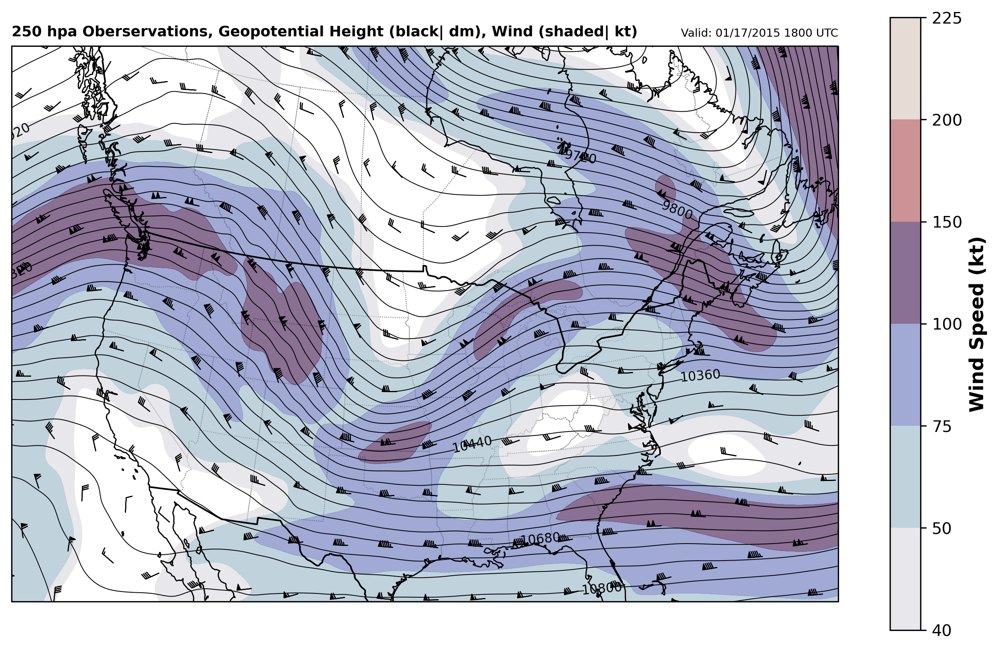

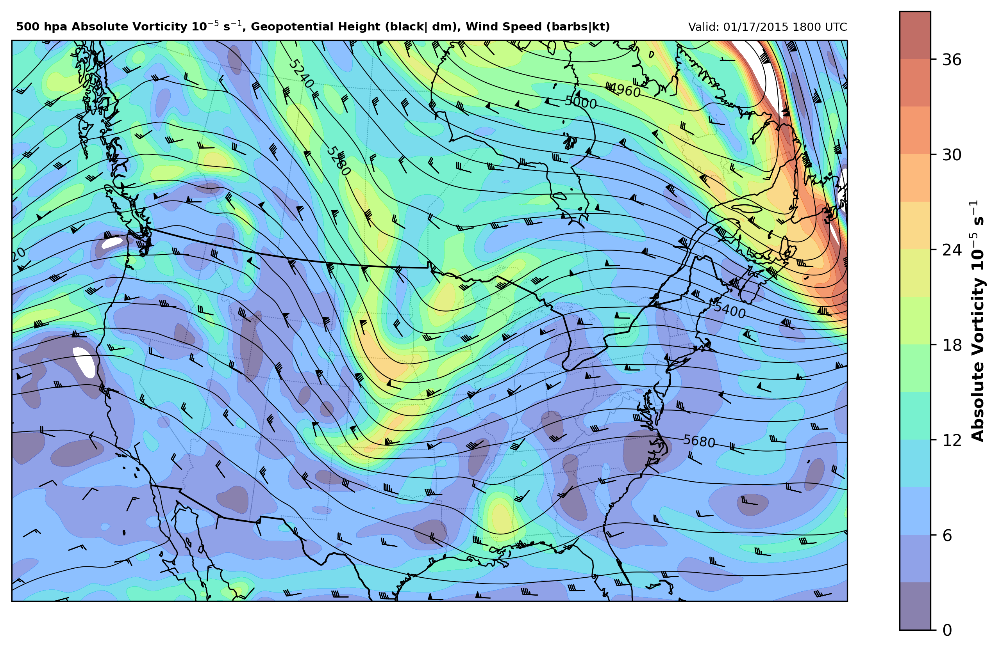

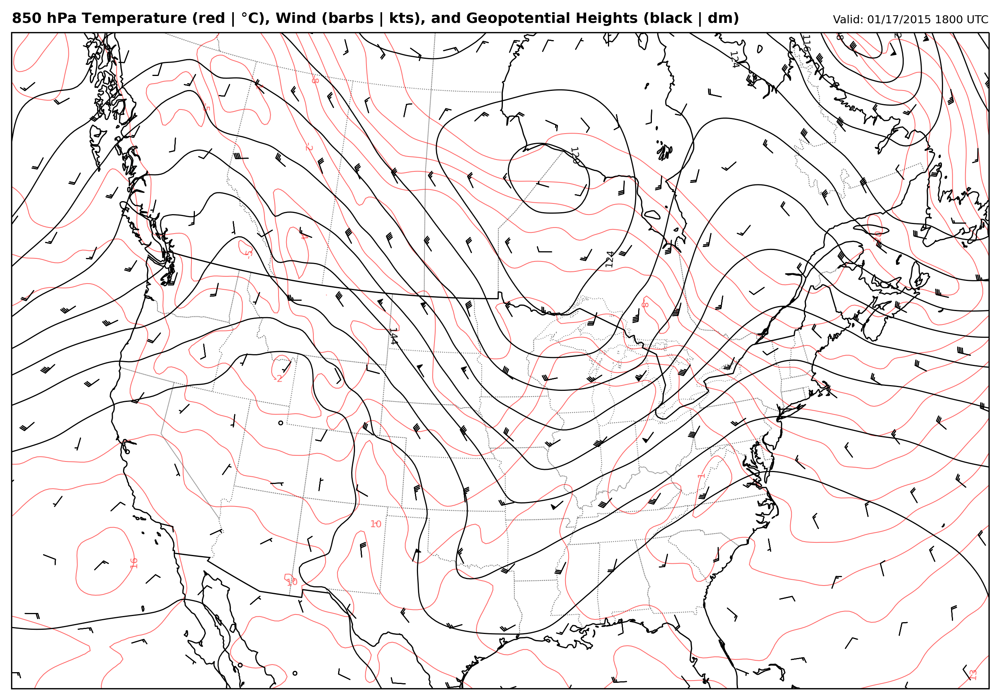

In [7]:
time=datetime(2015,1,17,18)
model_data=process_upper_air_data(time)
plot_250_map(time,model_data)
plot_vort_gh(time, model_data)
plot_850_map(time,model_data)

skipping variable: paramId==260131 shortName='o3mr'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 676, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/opt/tljh/user/lib/python3.7/site-packages/cfgrib/dataset.py", line 609, in dict_merge
    "key=%r value=%r new_value=%r" % (key, master[key], value)
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   30.,   20.,   10.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([400., 350., 300., 250., 200., 150., 100.,  70.,  50.,  30.,  20.,
        10.]))
skipping variable: paramId==135 shortName='w'
Traceback (most recent call last):
  File "/opt/tljh/user/lib/python3

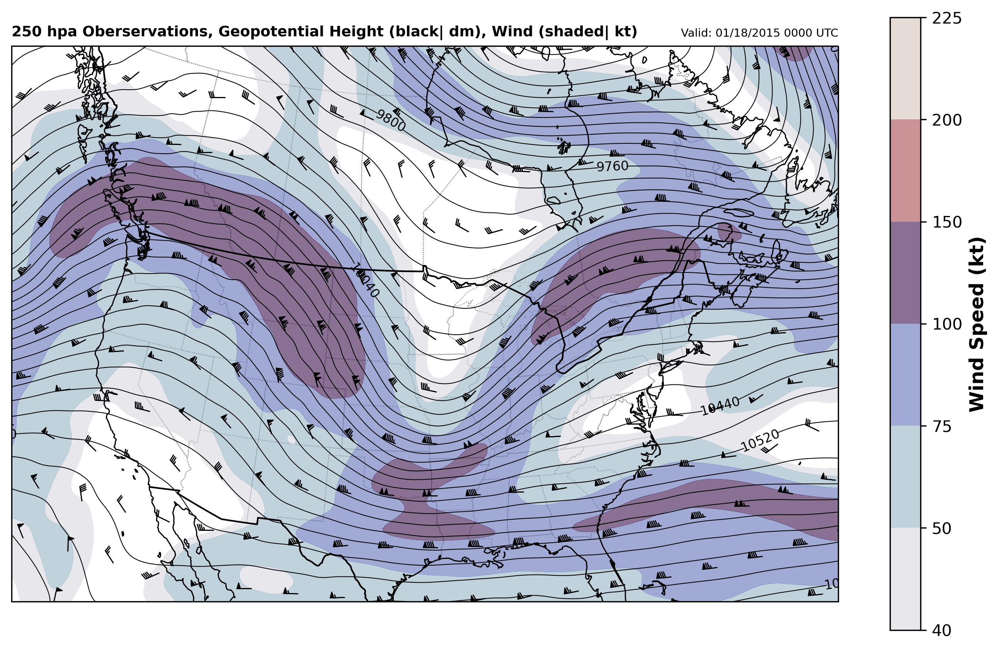

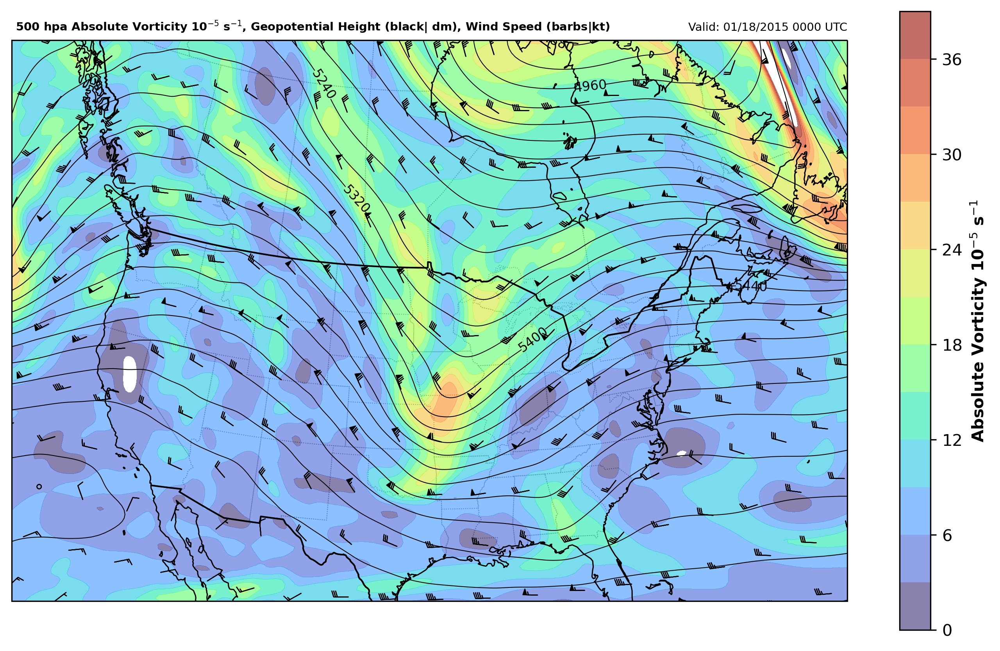

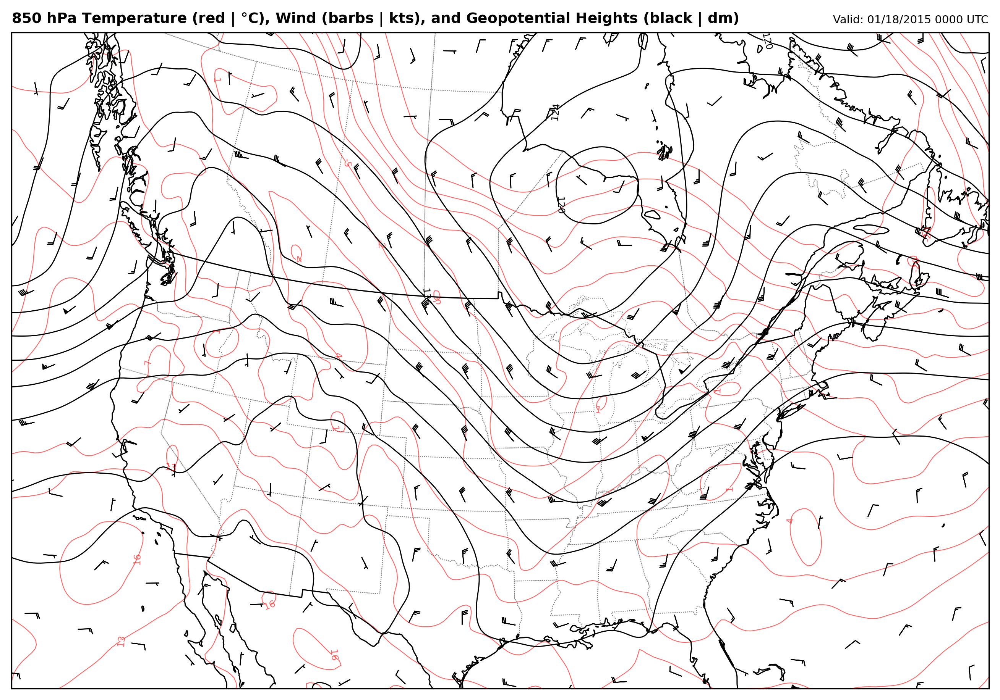

In [8]:
time=datetime(2015,1,18,0)
model_data=process_upper_air_data(time)
plot_250_map(time,model_data)
plot_vort_gh(time, model_data)
plot_850_map(time,model_data)